# Guldfynd inledning

Guldfyns satsning borde inte bara ligga i silver och guld då diamant också är ett väldigt bra föresäljnings föremål. Jag ska nu visa er en dataanalys som är baserad på ett diamantdataset, syftet med detta är att idetifiera mönster och faktorer som kan påverka pris och kvalitet.

# Bakgrund
Diamanter är en av dem mest populäraste ädelstenar då det både är väldigt fina och kan användas till smycken men också verktyg då diamant som material är välidgt starkt. Jag kommer nu att gå igenom hur man värderar dem, vilka risker och möjligheter som finns, samt hur marknaden fungerar.

## 💎 Hur man värderar diamanter – De 4 C:n
### 1. Carat – Vikt
__Vikten på diamanten, där 1 carat = 0.2 gram.
Hur påverkar det värdet? Ju högre carat, desto större diamant – vilket ofta innebär ett högre pris.__

### 2. Clarity – Klarhet
__Mäter hur fri diamanten är från inre (inklusioner) och yttre (fläckar) defekter.__

__Graderingar (från bäst till sämst):__
* FL (Flawless)
* IF (Internally Flawless)
* VVS1 / VVS2 (Very Very Slight Inclusions)
* VS1 / VS2 (Very Slight Inclusions)
* SI1 / SI2 (Slight Inclusions)
* I1 / I2 / I3 (Included – tydliga inneslutningar)
  
### 3. Color – Färg
__En diamant är mest värdefull när den är färglös.
Graderingar (från bäst till sämst):__
* D (helt färglös)
* E–F (nästan färglösa)
* G–H (lätt ton)
* I–J (synlig färgton)
* K och nedåt (tydlig färgton)

## 4. Cut – Slipning
__Bedömer hur väl diamanten är slipad – alltså dess proportioner, symmetri och polering.__
* Excellent = Ideal
* Very Good = Premium
* Good = Very Good
* Fair = Good
* Poor = Fair

# Data kvalitets granskning

In [38]:
import pandas as pd
import numpy as np
import plotly.express as px
import pip as p
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from sklearn.linear_model import LinearRegression
df = pd.read_csv("diamonds.csv")

# Eliminering av nullvärden
df.dropna(how="any", inplace=True) # Tar bort nullvärden

# Eliminering av negativa eller nollor i dimnesions värden
df = df[(df['x'] > 0) & (df['y'] > 0) & (df['z'] > 0)] # Ta bort nollor eller negativa värden

# Eliminering av felaktig depth-värden
df["depth_calc"] = 2 * (df["z"] / (df["x"] + df["y"])) * 100 # Beräkna depth enligt formel
df["depth_diff"] = np.abs(df["depth"] - df["depth_calc"]) # Skillnad mellan depth i dataframen mot beräknad depth
felaktiga_depthvärden = df[df["depth_diff"] > 1]# Visa de som skiljer sig med mer än 1 procent.
df = df.drop(felaktiga_depthvärden.index, errors='ignore') # Ta bort felaktiga_depthvärden från dataframe.

### Syftet med ovanstående kod är att säkerhetsställa att datan i min analys stämmer genom att eliminera data som är fel eller ologisk.
#### **Eliminering av nullvärden**
* Jag tar bort diamanter som saknar värden
#### **Eliminering av negativa-värden eller nollor i dimnesions-värderna**
* Jag tar bort diamanter som har 0 eller mindre mått.
#### **Eliminering av felaktig depth-värden**
* Jag tar alla dimensions-vräden och använder en formel för att räkna ut djupet på dem, om de inte stämmer överens med de uträknade djupet som redan finns i databasen med marginal 1% så tar jag bort den diamanten.

# Analys

__I min analys kommer jag att gå igenom__
1. En överblick över vårat diamant dataset
2. Efterfrågan och målgruppskonsumenter
3. Volatilitet,
4. Och sist men inte minst investeringtaktiker

## Överblick
Här kommer jag visa en snabb överblick över datan diamant/pris distrubution mot carat.

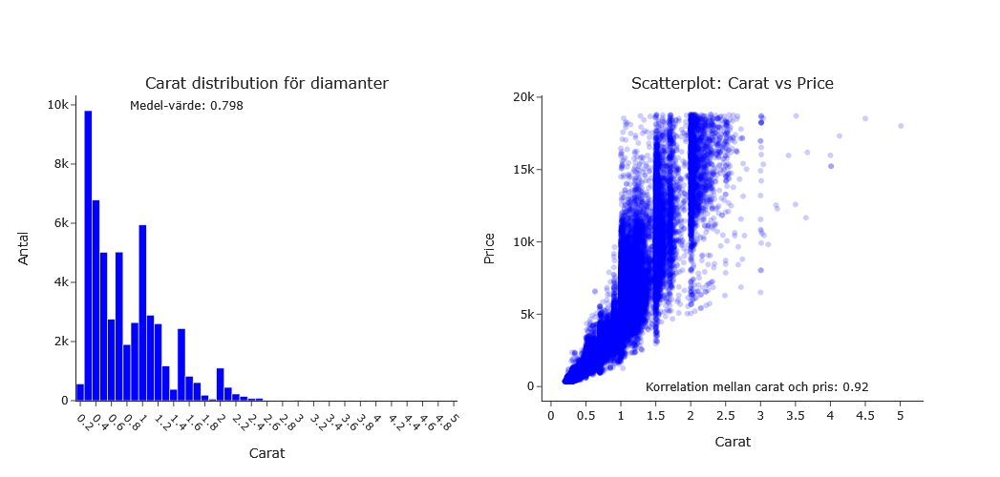

In [63]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import numpy as np

mean_carat = df["carat"].mean().round(3)
correlation = df['carat'].corr(df['price'])

fig = make_subplots(rows=1, cols=2, subplot_titles=["Carat distribution för diamanter", "Scatterplot: Carat vs Price"])

fig.add_trace(
    go.Histogram(
        x=df["carat"],
        nbinsx=50,
        marker_color="blue",
        name="Carat distribution"
    ),
    row=1, col=1
)

fig.add_vline(
    x=mean_carat,
    annotation_text=f"Medel-värde: {mean_carat}",
    annotation_position="top right",
    row=1, col=1
    
)

fig.add_annotation(
    text=f"Korrelation mellan carat och pris: {correlation:.2f}",
    xref="paper", yref="paper",
    x=2.95, y=0.05,
    showarrow=False,
    row=1, col=2
)

fig.add_trace(
    go.Scatter(
        x=df["carat"],
        y=df["price"],
        mode="markers",
        marker=dict(color="blue", opacity=0.2),
        name="Carat vs Price"
    ),
    row=1, col=2
)

fig.update_layout(
    height=500,
    width=1000,
    showlegend=False,
    template="simple_white"
)

fig.update_xaxes(
    title_text="Carat",
    tickangle=45,
    tickvals=np.arange(0, df["carat"].max() + 0.5, 0.2),
    row=1, col=1
)
fig.update_xaxes(
    title_text="Carat",
    tickvals=np.arange(0, df["carat"].max() + 0.5, 0.5),
    row=1, col=2
)
fig.update_yaxes(title_text="Antal", row=1, col=1)

fig.update_xaxes(title_text="Carat", row=1, col=2)
fig.update_yaxes(title_text="Price", row=1, col=2)

fig.show()


__Vad ser vi?__

Vi ser här majoriteten av diamanterna väger under 1.2 Carat och dessutom att korrelationen mellan carat och pris är positiv då den ligger på 0,92. Om vi tittar närmre på den andra plotten så ser vi att mellan 1 til 2 carat är det välidgt mycket pris variation(punkterna har mycket spridning). Detta betyder att dessa caratstorlekar är mer eftertraktade på marknaden än andra. 


__Varför?__

En vanlig fråga vid tolkningen av denna typ av diagram är varför vissa diamanter på 3 carat säljs till samma pris som diamanter på knappt 1 carat. Förklaringen ligger i andra kvalitetsaspekter, såsom slipning (cut), klarhet (clarity) och färg (color). En större diamant med dålig slipning eller låg klarhet kan ha betydligt lägre visuellt värde än en mindre diamant med bra slipning och hög klarhet.

Detta visar att kundernas efterfrågan inte enbart styrs av vikt, utan snarare av det visuella intryck diamanten ger, där slipning ofta spelar en avgörande roll. En välslipad diamant reflekterar ljus bättre och upplevs som mer briljant, vilket kan motivera ett högre pris oavsett carat.


__Rekommendation__

För att göra de bästa investeringarna bör företaget fokusera på diamanter med hög slipningskvalitet (Cut), gärna i kombination med god klarhet och färg. Det visuella intrycket väger ofta tyngre för kunder än storleken i sig.

Det kan också vara strategiskt att identifiera caratstorlekar som är särskilt eftertraktade, exempelvis ser vi att diamanter mellan 1 och 2 carat visar stor prisvariation, vilket tyder på att det finns möjlighet till god vinstmarginal om man investerar i stenar med hög kvalitet.

Sammanfattningsvis: investera i välslipade diamanter inom attraktiva viktklasser snarare än att enbart fokusera på stora stenar. Det är där det verkliga affärsvärdet ligger.

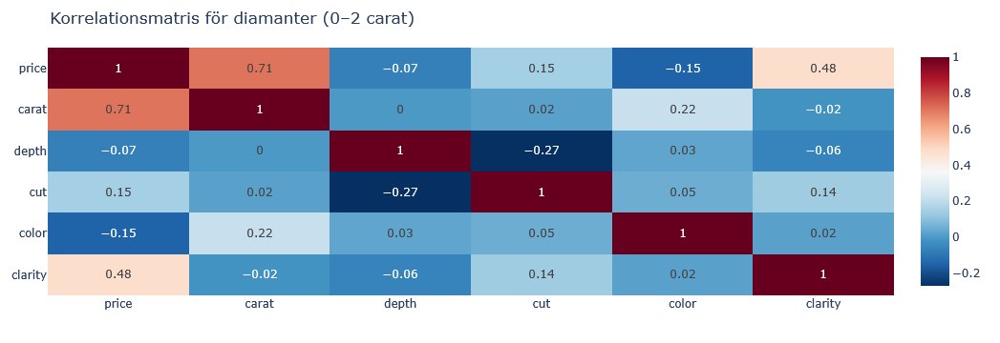

In [7]:
# Filtrera diamanter mellan 0 och 2 carat
df_filtered = df[(df['carat'] >= 1) & (df['carat'] <= 2)].copy()

# Kategori-indelning (om det inte redan gjorts tidigare)
df_filtered["cut"] = pd.Categorical(df_filtered["cut"], categories=["Fair", "Good", "Very Good", "Premium", "Ideal"], ordered=True)
df_filtered["color"] = pd.Categorical(df_filtered["color"], categories=["D", "E", "F", "G", "H", "I", "J"], ordered=True)
df_filtered["clarity"] = pd.Categorical(df_filtered["clarity"], categories=["I1", "SI2", "SI1", "VS2", "VS1", "VVS2", "VVS1", "IF"], ordered=True)

# Koda kategoriska variabler
df_filtered["cut_encoded"] = df_filtered["cut"].cat.codes
df_filtered["color_encoded"] = df_filtered["color"].cat.codes
df_filtered["clarity_encoded"] = df_filtered["clarity"].cat.codes

# Skapa dataset för korrelation
correlation_data = df_filtered[['price','carat', 'depth',
                                'cut_encoded', 'color_encoded', 'clarity_encoded']]

# Byt namn på kolumnerna för att visa rätt etiketter i heatmap
correlation_data = correlation_data.rename(columns={
    'cut_encoded': 'cut',
    'color_encoded': 'color',
    'clarity_encoded': 'clarity'
})

# Skapa korrelationsmatris
correlation_matrix = correlation_data.corr()
rounded_corr = np.round(correlation_matrix, 2)

# Skapa Plotly heatmap
import plotly.express as px
fig = px.imshow(rounded_corr,
                text_auto=True,
                color_continuous_scale='RdBu_r',
                title="Korrelationsmatris för diamanter (0–2 carat)",
                aspect="auto")

fig.update_layout(margin=dict(l=50, r=50, t=50, b=50))
fig.show()

__Vad ser vi?__

Ovan ser vi en korrelationsmatris över alla diamanternas features mellan carat värde 0 till 2. Även om carat (vikten på diamanten) visar en stark positiv korrealtion med priset (0.71), så är det viktigt att inte bara titta på detta sambandet. Den starkaste korrelationen utöver carat är clarity med 0.48. Det innebär att ju bättre klarhet desto högre pris. Därefter är cut med 0.15 och sist color. Här ser vi också att carat inte har lika viktigt faktor än vad den hade i hela datasetet.

__Varför?__
I spannet mellan 0 till 2 carat finns många liknande diamanter i vikt, vilket gör att köpare jämför mer på andra aspekter, särkilt tydligt på klarheter (clarity). Detta är varför carat inte har lika stor faktor som den har i hela datasetet. 

Cut och color är fortfarande viktiga, men påverkar inte priset lika mycket inom detta viktsegmentet.


__Vad ska vi göra?__
Satsa på diamanter med hög klarhet (gärna VS1 eller bättre) eftersom dessa har störst påverkan på priset enligt datan. Eftersom de flesta diamanter som säljs ligger under 1,2 carat, bör vi rikta in sortimentet mot detta spann men deadlinen borde ligga på högst 2 carat för majoriteten av diamanterna.

## Efterfrågan

__Vad värdesätter kunderna mest?__

När det gäller diamantens fyra C:n – Carat, Cut, Clarity och Color – visar vår analys att Clarity är den faktor som påverkar priset mest i segmentet 0–2 carat. Det innebär att kunderna i detta viktspann i högre grad betalar för diamanter med hög klarhet, snarare än bara storlek eller slipning.

__Varför är clarity viktigt?__

Clarity avgör hur ren en diamant är. Inom spannet 0–2 carat, där många diamanter har liknande storlek, blir andra kvalitetsfaktorer viktigare för kundens helhetsintryck. En klar diamant upplevs som mer exklusiv och elegant, vilket ökar värdet.

__Hur viktiga är Cut och Carat?__

* Cut är fortfarande avgörande för det visuella. En välskuren diamant reflekterar ljuset, glittrar mer och kan därmed uppfattas som mer attraktiv.

* Carat (storlek) är betydelsefull, men eftersom majoriteten av försäljningen sker under 1.2 carat, får carat ett lägre relativt genomslag än clarity i denna analys.

__Rekommendation__

* Satsa på diamanter med hög klarhet (t.ex. VS1 eller bättre) inom spannet upp till 1.2 carat.

* Kombinera gärna detta med god slipningskvalitet (Cut: Excellent eller Very Good) för att vara säker.

* På så sätt kan vi erbjuda diamanter som både ser exklusiva ut och ger hög marginal utan att behöva investera i stora stenar.

## Volatilitet

#### Volatilitet beskriver hur mycket samt hur snabbt priset på  en vara förändras över tid.
* Hög volatilitet betyder att priset varierar väldigt mycket. (high risk, high reward)
* Låg volatilitet betyder att priset varierar välidgt lite. (low risk, low reward)
Vi letar efter den högsta volatiliteten då det är där man har bäst möjlighet att göra de största investering


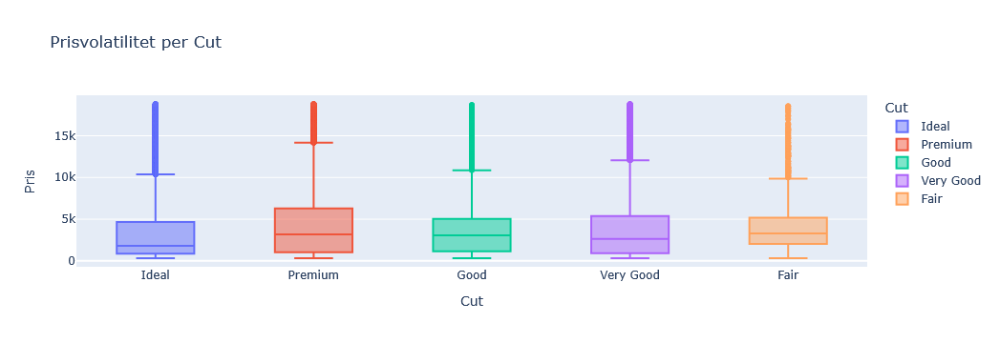

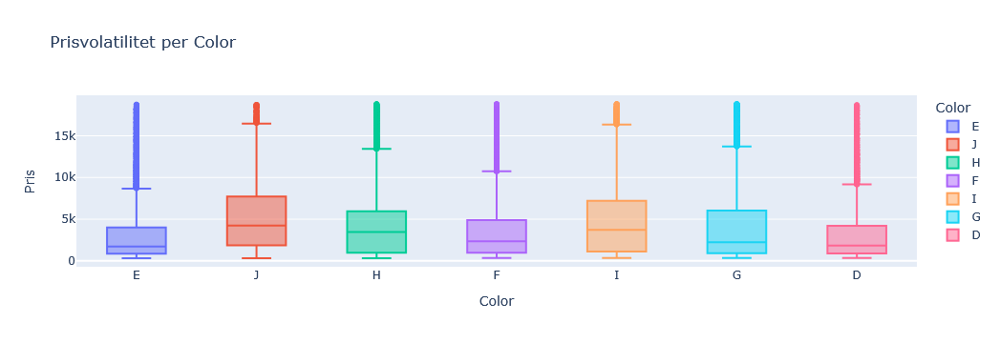

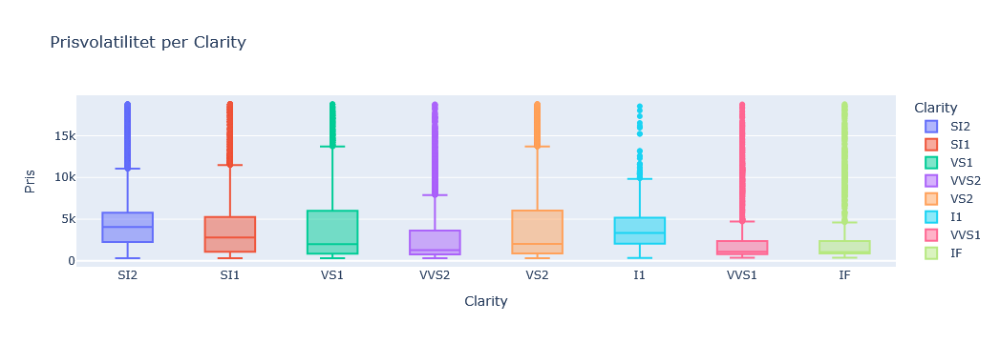

In [8]:
# Pris-volatilitet för Cut
fig_cut = px.box(df, x="cut", y="price", title="Prisvolatilitet per Cut",
                 labels={"cut": "Cut", "price": "Pris"}, color="cut")
fig_cut.show()

# Pris-volatilitet för Color
fig_color = px.box(df, x="color", y="price", title="Prisvolatilitet per Color",
                   labels={"color": "Color", "price": "Pris"}, color="color")
fig_color.show()

# Pris-volatilitet för Clarity
fig_clarity = px.box(df, x="clarity", y="price", title="Prisvolatilitet per Clarity",
                     labels={"clarity": "Clarity", "price": "Pris"}, color="clarity")
fig_clarity.show()

__Vad ser vi?__

Ovan ser vi boxplots av prisvolatiliteten per varje aspekt. Här ser vi att vissa kategorier har mycket större spridning i priser än andra, vilket betyder att det finns både väldigt billiga och väldigt dyra diamanter inom samma klassificering.


De tre som sticker ut mest ur varje aspekt är:
* Clarity: VVS1, VVS2, VS1
* Cut: Ideal, Premium, Very Good
* Color: E, F, D

Detta innebär att dessa kategorier innehåller både lågt och högt prissatta diamanter, vilket skapar ett bredare spann och därmed mer osäkerhet kring värdet.


__Varför?__

För att läsa av volatiliteten måste man titta på bredden av lådan och den högsta/minsta värdet, men också hur många outliers som finns längst upp. En kombination av mycket bredd på både låda och högst/minsta värdet samt många outliers tyder på en hög volatilitet.
Nu om vi tittar på de som hade högst volatilitet märker vi att majoriteten av dessa kategorier ligger alla högt i dess egna skala. Tillexmepel Ideal är den bästa slipningsgraden, D och F är de mest färglösa diamanterna, samt VVS1 och VS1 är diamanter som nästan är helt felfria.



__Rekommendation__
* Var försiktigt vid inköp inom dessa grupper, då priset kan variera kraftigt trots att egenskaper hos diamanterna kan vara lika.
* Dessa kategorier har större vinstpotential, men också större risk.
* För att skapa stabilitet i verksamheten, investera även i segment med lägre volatilitet.
* Använd de volatila segmenten strategiskt: köp när priset är lågt och sälj när det är högt.

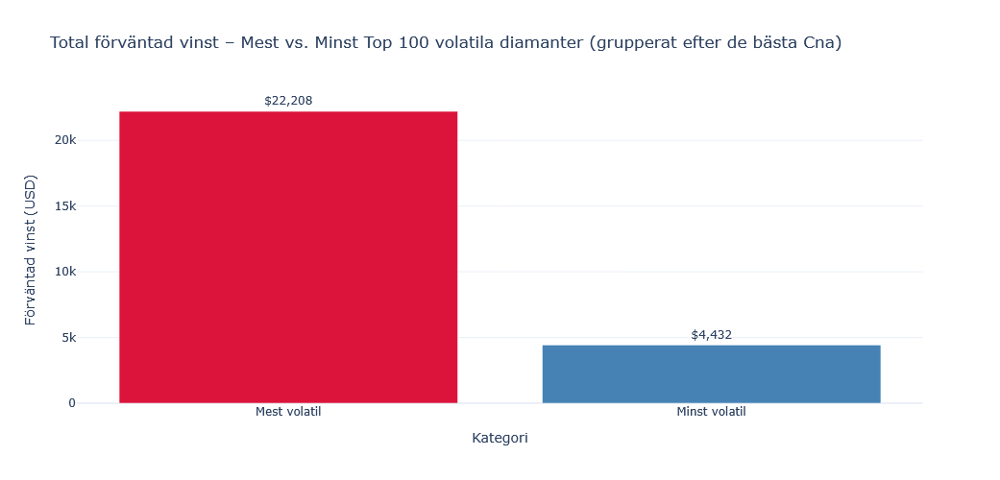

In [53]:
# Filltrera diamanter för att kunna gruppera för så bra standard som möjligt
good_diamonds = df[
    (df["cut"].isin(["Ideal", "Premium", "Very Good"])) &
    (df["color"].isin(["D", "E", "F"])) &
    (df["clarity"].isin(["VVS1", "VVS2", "VS1"])) &
    (df["price"] < median_price)
].copy()

# Räkna ut vinst och vinst per karat
good_diamonds["expected_sale_price"] = (good_diamonds["price"] * 1.1).round(2)
good_diamonds["expected_profit"] = (good_diamonds["expected_sale_price"] - good_diamonds["price"]).round(2)
good_diamonds["profit_per_carat"] = (good_diamonds["expected_profit"] / good_diamonds["carat"]).round(2)

# Sortera ut det mest volatila och det minst volatila
most_volatile = good_diamonds.sort_values(by="profit_per_carat", ascending=False).head(100).copy()
least_volatile = good_diamonds.sort_values(by="profit_per_carat", ascending=True).head(100).copy()
most_volatile["kategori"] = "Mest volatil"
least_volatile["kategori"] = "Minst volatil"

# Kombinera kategorierna
volatility_df = pd.concat([most_volatile, least_volatile], ignore_index=True)

# Summera vinsterna per grupp
profits = volatility_df.groupby("kategori")["expected_profit"].sum()

# Skapa plotten
fig = go.Figure(go.Bar(
    x=profits.index,
    y=profits.values,
    text=[f"${v:,.0f}" for v in profits.values],
    textposition='outside',
    marker_color=['crimson', 'steelblue']
))

fig.update_layout(
    title="Total förväntad vinst – Mest vs. Minst Top 100 volatila diamanter (grupperat efter de bästa Cna)",
    yaxis_title="Förväntad vinst (USD)",
    xaxis_title="Kategori",
    template="plotly_white",
    height=500
)
fig.show()

__Vad ser vi?__


Den röda stapeln visar hur mycket vinst vi kan gå om vi köper de top 100 mest volitila diamanter och säljer dem med en +10% marginal, och den blåa visar samma vinst fast på dem top 100 minst volatila diamanterna.

Resultatet är mycket tydligt. Investeringar i de mest volatila diamanterna ger betydligt högre vinst.

__Varför?__


Volatilitet innebär större prisrörelser, vilket leder till möjligheter för vinster men också mer risker. I detta sammanhand har vi jämfört de mest och minst volatila diamanterna, där de mest volatila visat sig ge betydligt högre vinst.

Den röda stapeln ser väldigt lovande ut på papper, med en vinstnivå som är mycket större än de mer stabila alternativen. Trots detta måste man komma ihåg att hög volatilitet också innebär ökad risk. Priset kan snabbt falla, och utan en genomtänk strategi finns det risk att investeringar inte går med vinst. Det krävs alltså aktiva beslut, nogrann analys och god marknadsförståelse för att kapitalisera här. 

Det mins volatila diamngerna ger en mycket mer förutsägbar och stabil vinst men med lägre avkastning, vilket passar passa investerare eller företag som prioriterar stabilitet framför högre avkastning.


__Rekommendationer till smyckesföretag__
* Bygg en balanserad portfölj genom att kombinera hög och lågvolatila diamanter för att kontrollera och minksa riskerna som finns.
* Prioritera investeringar i de mest volatila diamanterna endast om företaget har kapacitet att hantera den högre risken som hänger med.
* Använd datadrivenanalys för att regelbundet identifiera diamaner men hög vinstpotential och undvik att köpa övervärderade diamanter.
* Följ marknadstrender och justera inköp, t.ex om diamanter med högklarhet plötsligt är mindre värda än en diamant med bra slipning.


__Sammanfattningsvis__

Genom att använda oss av dessa rekommendationer, såsom att balansera portföljen, göra investeringar baserat på volatilitet, använda datadriven analys och agera på marknadstrender så kan Guldfynd fatta mer strategiska beslut. Detta skapar inte bara bättre förutsättningar för vinst, utan bidrar också till minskad risk för företaget. Med rätt strategi kommer företaget att kunna maximera sin vinstpotential och samtidigt bygga starkare och mer flexibela affärer.

## Helhets Sammanfattning

Denna rapport syftar till att ge ett datadrivet beslutsunderlag kring vilka typer av diamanter som är bäst för inköp och vidareförsäljning inom smyckesmarknaden. Analysen utgår från ett omfattande dataset av diamanter med variabler såsom vikt (carat), färg (color), klarhet (clarity), slipning (cut) och pris.

Genom att kombinera statistisk analys och visualiseringar har vi identifierat att mindre diamanter, i synnerhet mellan 0.3 och 0.9 carat, erbjuder störst potential för lönsamhet. Dessa stenar uppvisar ett starkt förhållande mellan pris och kvalitet, särskilt när de har höga värden inom färg och klarhet. Priset ökar exponentiellt med carat, men kvalitetsegenskaper som färg och klarhet har större påverkan på priset för stenar under 1.0 carat, vilket skapar möjlighet för prisvärda investeringar.

Ett särskilt fokus har legat på att identifiera diamanter som säljs under medianpriset i sin kvalitetsklass. Genom att analysera och identifiera prisavvikelser har jag hittat undervärderade stenar med hög återförsäljningspotential.

Slutligen har ett interaktivt analysverktyg (baserat på Python och Jupyter Notebook) tagits fram. Detta verktyg möjliggör utvärdering av nya datasätt och kan användas av inköpsteamet för att snabbt identifiera attraktiva objekt att investera i.

Rekommendation: Guldfynd bör initialt fokusera på diamanter mellan 0.3 och 0.9 carat med mycket god till utmärkt färg och klarhet. Dessa erbjuder optimal balans mellan kundvärde och affärsmarginal samt passar väl med preferenser på marknaden.